# Przegląd danych

In [1]:
import os

import numpy as np
import cv2
import matplotlib.pyplot as plt

In [2]:
dataset_dir = '../images/train'

train_images_names = os.listdir(f'{dataset_dir}/img')
train_masks_names = os.listdir(f'{dataset_dir}/mask')

train_images = [cv2.imread(f'{dataset_dir}/img/{img_name}') for img_name in train_images_names]
train_images = [cv2.cvtColor(img, cv2.COLOR_BGR2RGB) for img in train_images]

train_masks = [cv2.imread(f'{dataset_dir}/img/{mask_name}', cv2.IMREAD_GRAYSCALE) for mask_name in train_images_names]

## Przykładowe obrazy (RGB)

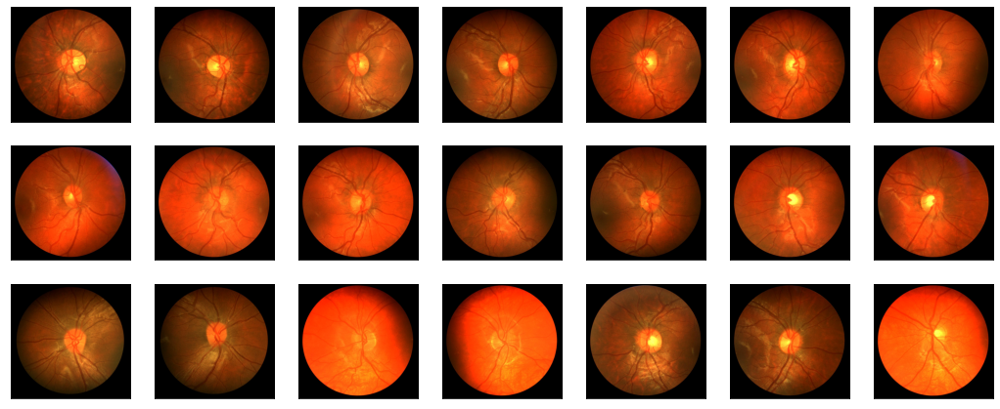

In [3]:
plt.figure(figsize=(18, 10))

for idx, img in enumerate(train_images, start=1):
    plt.subplot(4, 7, idx)
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])

plt.show()

## Przykładowe obrazy (jeden kanał)

### Czerwony

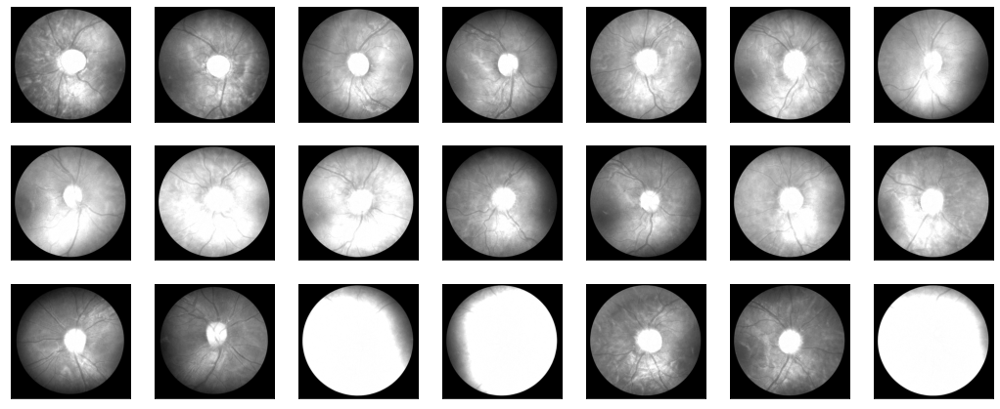

In [4]:
plt.figure(figsize=(18, 10))

for idx, img in enumerate(train_images, start=1):
    plt.subplot(4, 7, idx)
    plt.imshow(img[:, :, 0], cmap='gray')
    plt.xticks([])
    plt.yticks([])

plt.show()

### Zielony

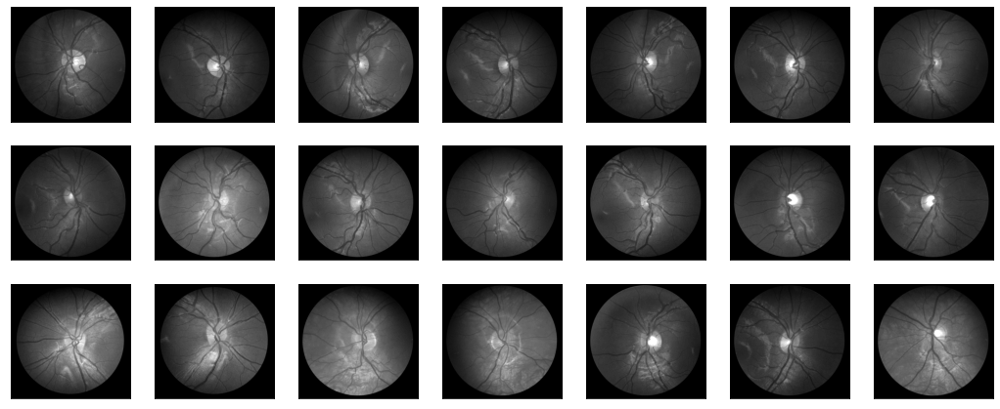

In [5]:
plt.figure(figsize=(18, 10))

for idx, img in enumerate(train_images, start=1):
    plt.subplot(4, 7, idx)
    plt.imshow(img[:, :, 1], cmap='gray')
    plt.xticks([])
    plt.yticks([])

plt.show()

### Niebieski

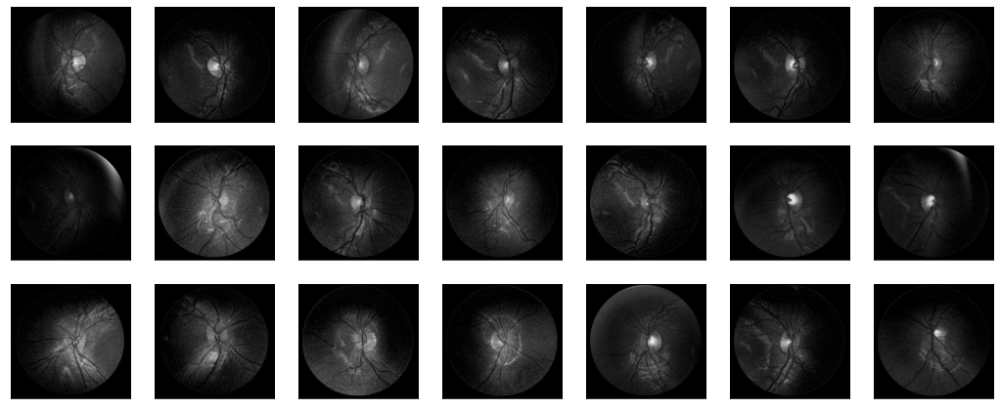

In [6]:
plt.figure(figsize=(18, 10))

for idx, img in enumerate(train_images, start=1):
    plt.subplot(4, 7, idx)
    plt.imshow(img[:, :, 2], cmap='gray')
    plt.xticks([])
    plt.yticks([])

plt.show()

**Naczynia krwionośne są najbardziej widoczne w zielonym kanale. W dalszej części będę używał tylko zielonego kanału w celu redukcji wymiarowości.**

## Downsampling i upsampling obrazów

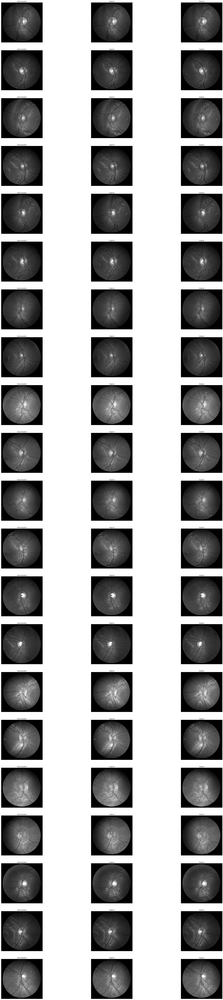

In [7]:
green_channel_images = [img[:, :, 1] for img in train_images]

downsampled_train_images = [cv2.resize(img, (256, 246), interpolation=cv2.INTER_AREA) for img in green_channel_images]
downsampled_train_masks = [cv2.resize(mask, (256, 246), interpolation=cv2.INTER_AREA) for mask in train_masks]

upsampled_train_images = [cv2.resize(img, (999, 960), interpolation=cv2.INTER_AREA) for img in downsampled_train_images]
upsampled_train_masks = [cv2.resize(mask, (999, 960), interpolation=cv2.INTER_AREA) for mask in downsampled_train_masks]

plt.figure(figsize=(42, 168))

for idx, (downsampled_img, upsampled_img, original_img) in enumerate(zip(downsampled_train_images, upsampled_train_images, green_channel_images), start=1):
    plt.subplot(21, 3, 3*idx - 2)
    plt.title("Downsampled")
    plt.imshow(downsampled_img, cmap="gray")
    plt.xticks([])
    plt.yticks([])

    plt.subplot(21, 3, 3*idx - 1)
    plt.title("Original")
    plt.imshow(upsampled_img, cmap="gray")
    plt.xticks([])
    plt.yticks([])

    plt.subplot(21, 3, 3*idx)
    plt.title("Original")
    plt.imshow(original_img, cmap="gray")
    plt.xticks([])
    plt.yticks([])

plt.show()

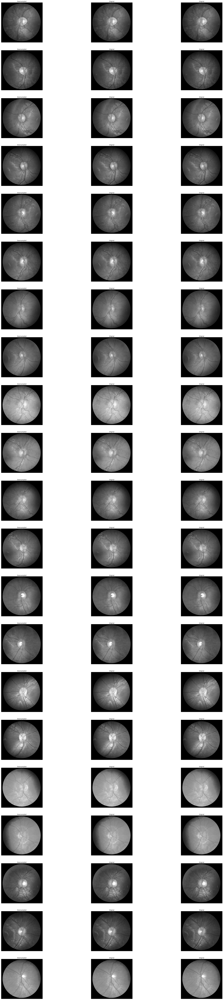

In [8]:
plt.figure(figsize=(42, 168))

for idx, (downsampled_mask, upsampled_mask, original_mask) in enumerate(zip(downsampled_train_masks, upsampled_train_masks, train_masks), start=1):
    plt.subplot(21, 3, 3*idx - 2)
    plt.title("Downsampled")
    plt.imshow(downsampled_mask, cmap="gray")
    plt.xticks([])
    plt.yticks([])

    plt.subplot(21, 3, 3*idx - 1)
    plt.title("Original")
    plt.imshow(upsampled_mask, cmap="gray")
    plt.xticks([])
    plt.yticks([])

    plt.subplot(21, 3, 3*idx)
    plt.title("Original")
    plt.imshow(original_mask, cmap="gray")
    plt.xticks([])
    plt.yticks([])

plt.show()

In [9]:
from sklearn.metrics import mean_squared_error

mse_mask = [mean_squared_error(original_mask, upsampled_mask) for (original_mask, upsampled_mask) in zip(train_masks, upsampled_train_masks)]
mse_img = [mean_squared_error(original_img, upsampled_img) for (original_img, upsampled_img) in zip(green_channel_images, upsampled_train_images)]

print(f"Mask:\nAvg mse: {np.mean(mse_mask)}, Std: {np.std(mse_mask)}")
print(f"Image:\nAvg mse: {np.mean(mse_img)}, Std: {np.std(mse_img)}")

Mask:
Avg mse: 5.829039207858652, Std: 1.0950503655769255
Image:
Avg mse: 6.069100697920142, Std: 1.067317808248589


**Straty jakości podczas downsamplingu i następnie upsamplingu są niewielkie, więc w celu ponownego zmniejszenia wymiarowości, zmniejszymy obrazy do rozmiaru (246, 256)**